## Graph tool

In [1]:
import graph_tool.all as gt

ModuleNotFoundError: No module named 'graph_tool'

In [2]:
#import graph_tool.all as gt
import matplotlib.pyplot as plt
import numpy as np
import matplotlib

### example of loading a pre-defined graph

In [2]:
g = gt.collection.ns["twitter_higgs/retweet"]

### basic numbers

In [3]:
print(g)

<Graph object, directed, with 256491 vertices and 328132 edges, 2 internal vertex properties, 1 internal edge property, 5 internal graph properties, at 0x1cac76390>


In [4]:
g.list_properties()

name            (graph)   (type: string, val: twitter_higgs (retweet))
description     (graph)   (type: string, val: Data on tweets related to the
                                              announcement of the discovery of
                                              a new fundamental particle with
                                              the features of the Higgs boson
                                              on 4th July 2012.  Data covers
                                              1-7 July 2012, and includes four
                                              types of networks: followers,
                                              retweets, replies, and mentions.)
citation        (graph)   (type: string, val: ['M. De Domenico, A. Lima, P.
                                              Mougel, M. Musolesi, "The Anatomy
                                              of a Scientific Rumor."
                                              Scientific Reports 3, 2980
       

### in- and out-degree distribution

In [5]:
in_hist = gt.vertex_hist(g, "in")

out_hist = gt.vertex_hist(g, "out")

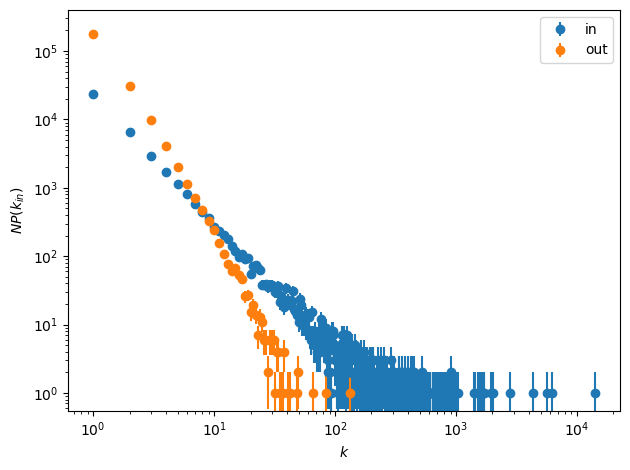

In [6]:
y = in_hist[0]
err = np.sqrt(in_hist[0])
plt.errorbar(in_hist[1][:-1], in_hist[0], fmt="o", yerr=err,
        label="in")

y = out_hist[0]
err = np.sqrt(out_hist[0])
plt.errorbar(out_hist[1][:-1], out_hist[0], fmt="o", yerr=err,
        label="out")

plt.yscale("log")
plt.xscale("log")

plt.xlabel("$k$")
plt.ylabel("$NP(k_{in})$")

plt.tight_layout()
plt.legend()

### select a subgraph for visualization

In [7]:
u = gt.extract_largest_component(g)

print(u)

u = gt.Graph(u, prune=True)

print(u)

<GraphView object, directed, with 984 vertices and 3850 edges, 2 internal vertex properties, 1 internal edge property, 5 internal graph properties, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x1cdd2fdd0, at 0x1ce13ce10>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x1cdd2fdd0, at 0x1cda303d0>, False), at 0x1cdd2fdd0>
<Graph object, directed, with 984 vertices and 3850 edges, 2 internal vertex properties, 1 internal edge property, 5 internal graph properties, at 0x1cdcdc190>


### spring layout

In [8]:
pos = gt.sfdp_layout(u)

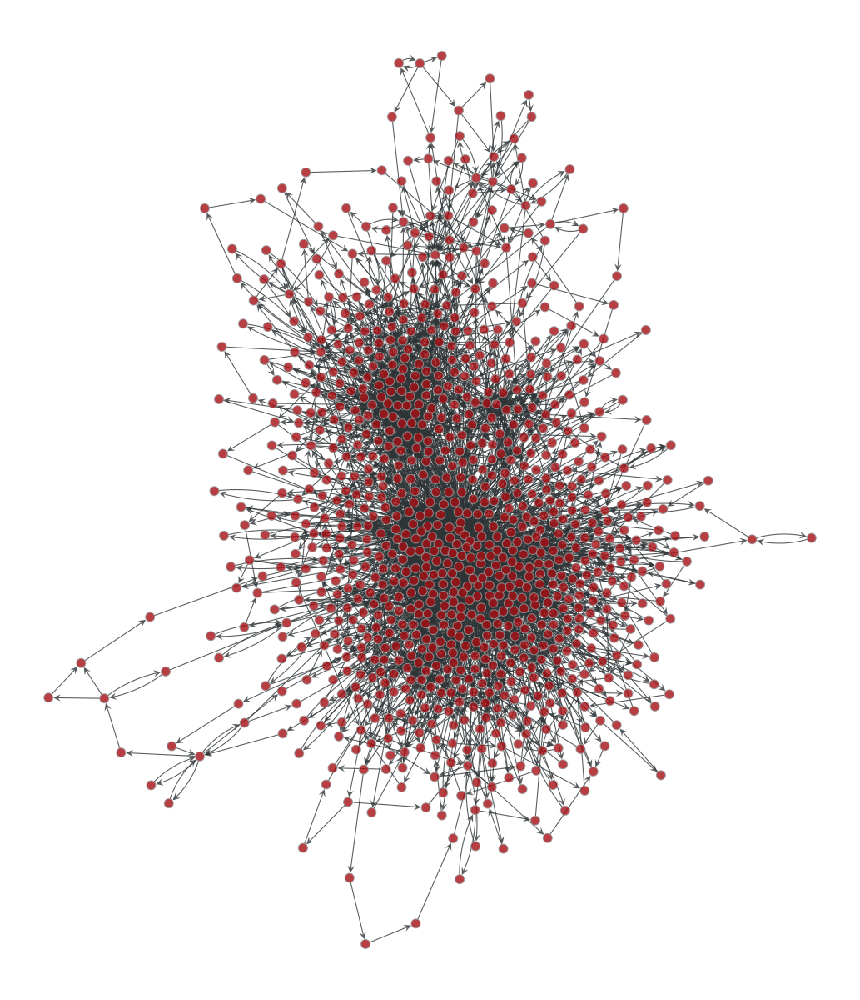

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1cdcdc190, at 0x1cdd1a050>

In [ ]:
gt.graph_draw(u, pos)

In [10]:
pos_fr = gt.fruchterman_reingold_layout(u, n_iter=100)

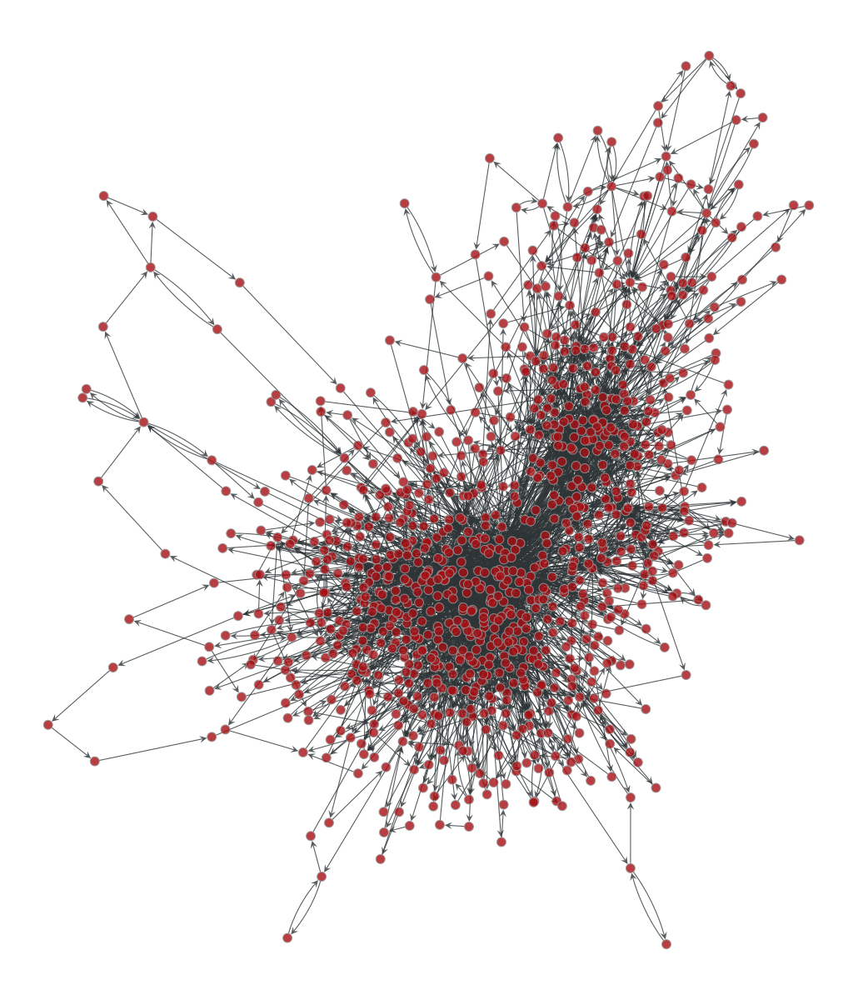

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1cdcdc190, at 0x1cdc4ca50>

In [12]:
gt.graph_draw(u, pos_fr)

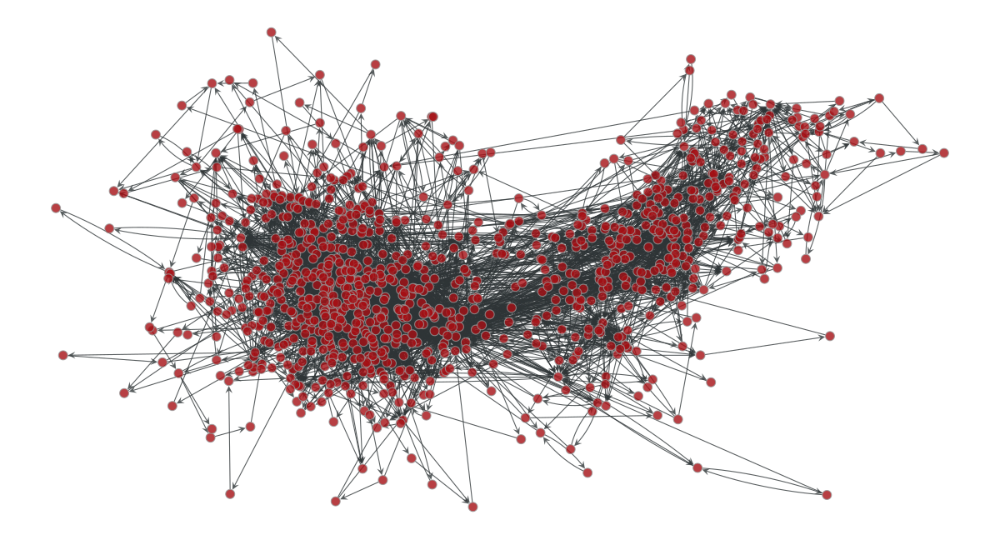

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1cdcdc190, at 0x1cdb86e10>

In [13]:
gt.graph_draw(u, pos=u.vp["_pos"])

In [14]:
import geopandas as gpd

countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

ModuleNotFoundError: No module named 'geopandas'

In [18]:
pos_tree = gt.radial_tree_layout(u, 0)

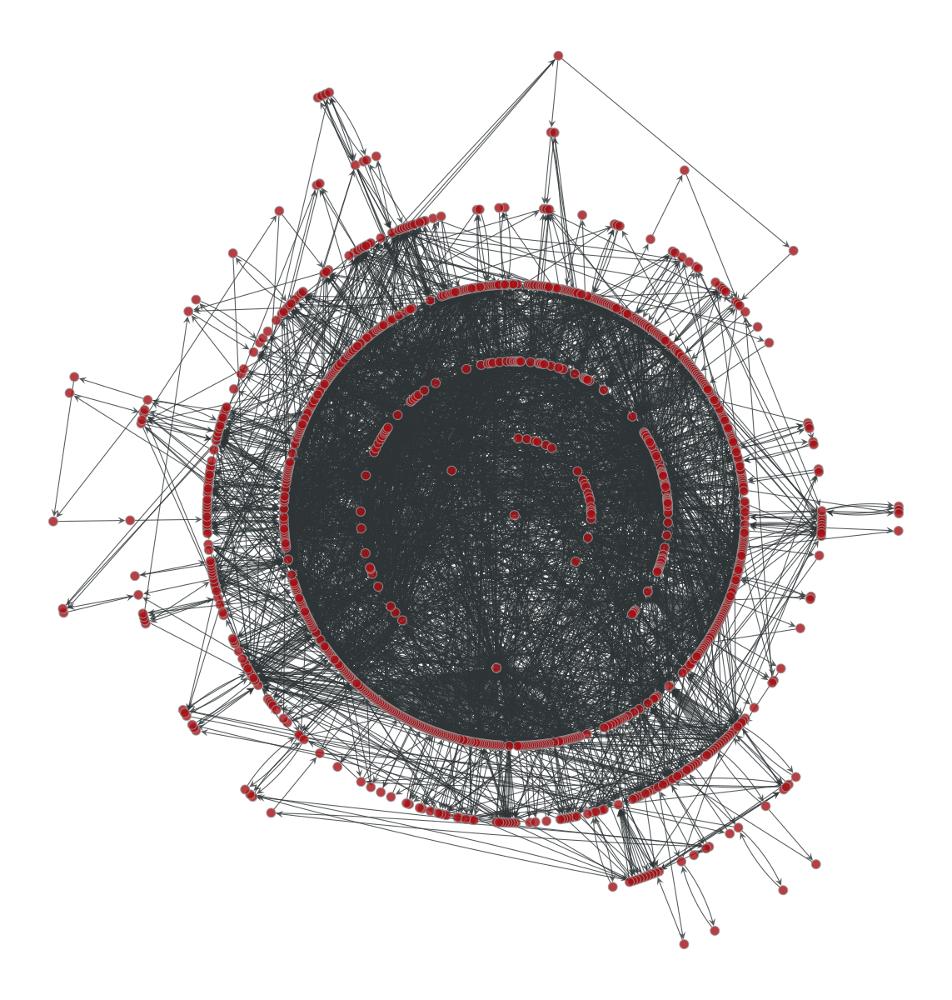

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1cdcdc190, at 0x1cdf3e790>

In [19]:
gt.graph_draw(u, pos_tree)

In [39]:
maximum = max(u.get_in_degrees(u.get_vertices()))

print(np.where(u.get_in_degrees(u.get_vertices()) == maximum))
print(u.get_in_degrees(u.get_vertices()))

(array([1]),)
[ 20 209   7   1  69 105   2   2  10  71  30   1   4   3   2   3  16   9
  95  66   1   1  25   2   3   2  46  11  37   1   1   8   3   2  24   5
   3   4  31   1   2  17  23   2   9   1   3   4   1  28   1   1  14   3
   1  14   1  20   5  11  31   8  42   8  25   6   2   5   1   3  14  11
   2  11  20   3   6  38   1   7  10   1   1   7   9   1   3   3  10  16
   2   5   3   2   3  13  47  12   3   7   3   1  11   2  11   3  11   1
   1  13  21  15   1  15   5   6  17   2   2   2   7   9   2  17  15   1
   9   2   2   1   3   2   2   1   1   3   1  19   3   3   1   2   4   2
   3  17  15   1  27   1   1  16   1   4  10  29   1  15   2   7   6   2
   8   1   2  19   5   7   6   1  11   4  13   3   1   8   2   1   5   4
   1   3   6   8   1   2  12   3  22  20   4   4   6  15   6  27   1   4
   6   2  10   1   1   6   1   2   5   2   2   4   5   1   2   3   2   2
   1   1   2   1   4   9   2  16   1   3   1  10   1   1  11   2   1  12
   1   1   1   4   1   1   4   2   1 

In [40]:
pos_tree = gt.radial_tree_layout(u, 1)

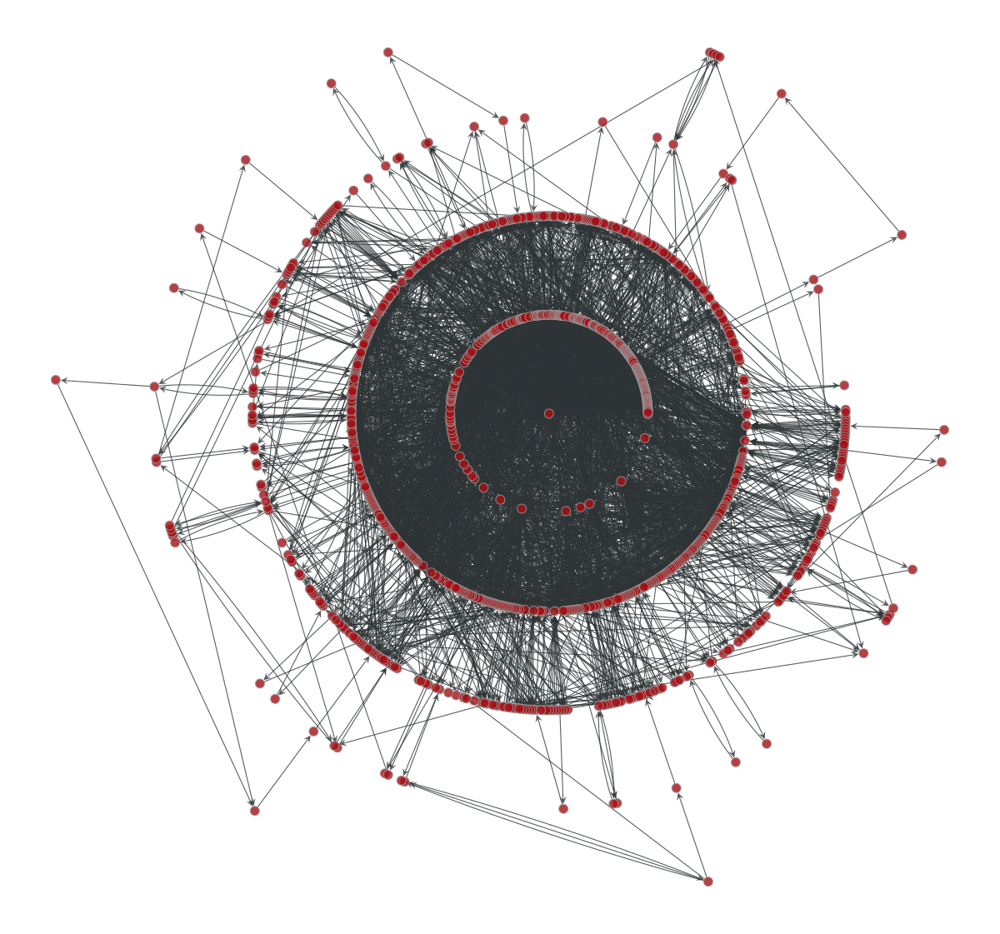

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1cdcdc190, at 0x1cee9b890>

In [42]:
gt.graph_draw(u, pos_tree)

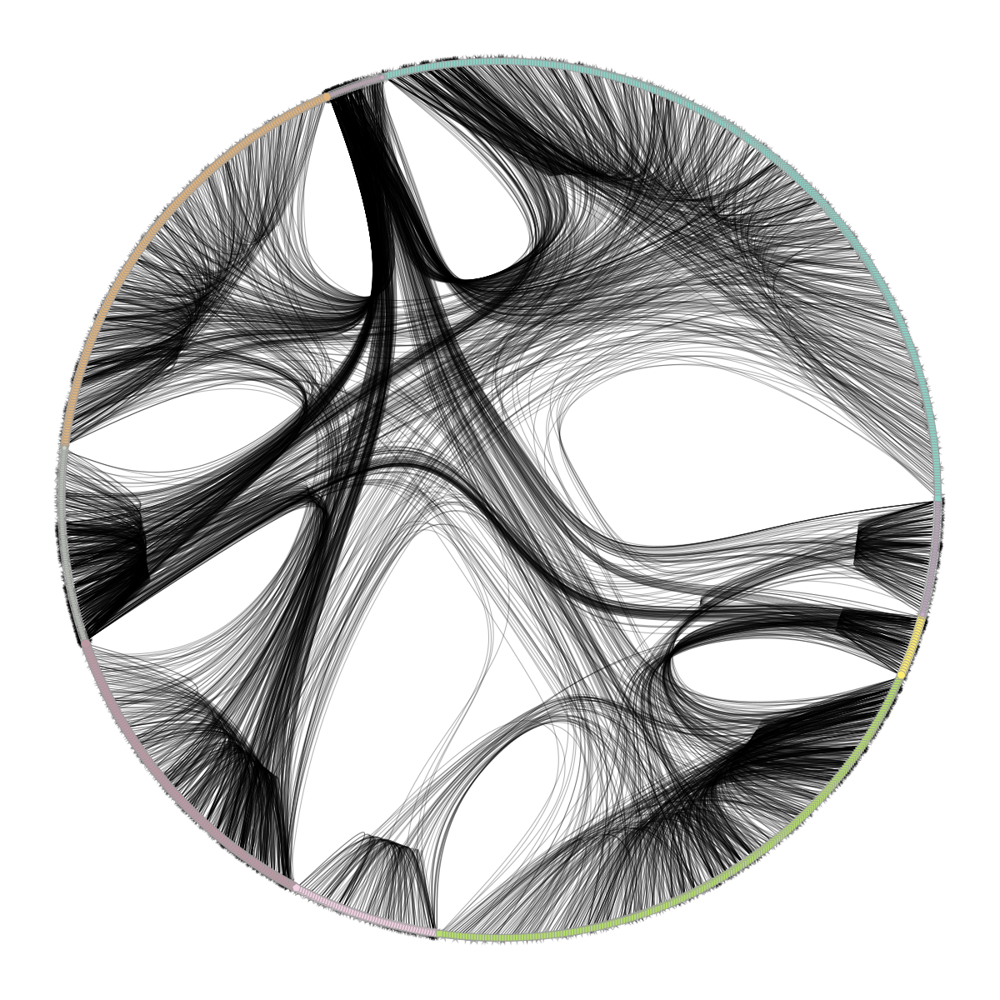

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1cdcdc190, at 0x1cee9e710>

In [43]:
state = gt.minimize_nested_blockmodel_dl(u)

t = gt.get_hierarchy_tree(state)[0]

tpos = pos = gt.radial_tree_layout(t, t.vertex(t.num_vertices() - 1, use_index=False), weighted=True)

cts = gt.get_hierarchy_control_points(u, t, tpos)

pos = u.own_property(tpos)

b = state.levels[0].b

shape = b.copy()

shape.a %= 14

gt.graph_draw(u, pos=pos, vertex_fill_color=b, vertex_shape=shape, edge_control_points=cts,

              edge_color=[0, 0, 0, 0.3], vertex_anchor=0)

### shortest paths

[ 4  0  4  7  3  3  5  6  5  3  3  8  7  7  7  4  5  4  2  2  9  4  3  7
  5  4  4  1  3  5 12  5  4  6  1  5  6  1  2  8  7  7  4  6  5  6  6 10
  5  3  3 12  5  8  9  6  3  5  4  3  6  4  2  3  3  8  9  3  6  4  3  6
  4  3  3  5  5  3  6  3  6 10  9  3  4 10  7  6  2  3  4  5  2  4  7  6
  3  3  3  4  5  6  4  5  4  6  3  6 10  3  3  6  5  3  4  4  3  6  5 11
  5  3  7  4  4  6  3  7  9  6  7  8  7  8  5  6  5  2  3  5  8  9  5  6
  4  3  5 11  5  4  6  4  8  7  3  2  6  3  7  6  2  6  3  7  5  5  6  3
  8 13  5  6  6  5  6  4  4  5  4  5  8  7  5  4  8  5  3  6  5  2  7  5
  8  2  7  2  7  4  4  5  6  6 13  3  6  4  6  5  7  6  2  4  5  3  6  6
  6  7  7  5  7  4  5  2  4  2  3  4  5  6  5  6 10  2  5  7  9  4  4  5
  4 11  7  5  6  2  6  6  3  4  6  8  2  5  4  4  7  6  4  8  4  8  6  5
  9 10  3  7  3  8  2  6  9  4  4  3  2 10  8  7  5  7  7  5  6  6  5  8
  5  6  7  4  6  5  4  3  6  8  6  4  8  3  6  6  6 10  6  7  5  6  4  7
  7  4  5  8  5  7  8  3  5  4  8  7  5  4  4  4  6

(array([  4.,  35., 239., 182., 168., 210.,  60.,  58.,  19.,   9.]),
 array([ 0. ,  1.4,  2.8,  4.2,  5.6,  7. ,  8.4,  9.8, 11.2, 12.6, 14. ]),
 <BarContainer object of 10 artists>)

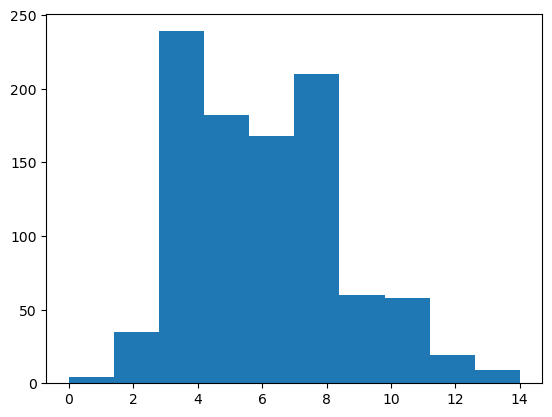

In [46]:
dist = gt.shortest_distance(u, source=u.vertex(1))

print(dist.a)

plt.hist(dist.a)

[0.00000e+00 3.85000e+03 1.61740e+04 5.13150e+04 1.04671e+05 1.51297e+05
 1.65706e+05 1.45488e+05 1.10912e+05 8.01430e+04 5.50390e+04 3.61810e+04
 2.37380e+04 1.34440e+04 5.98300e+03 2.13800e+03 7.69000e+02 2.82000e+02
 1.01000e+02 3.40000e+01 7.00000e+00]


<BarContainer object of 21 artists>

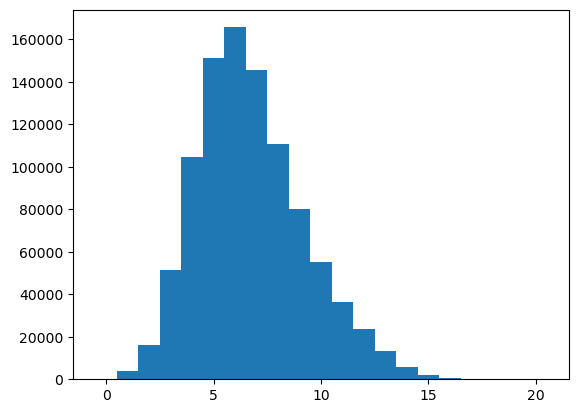

In [47]:
hist, bin_edges = gt.distance_histogram(u)
print(hist)
plt.bar(bin_edges[:-1], hist, width=1)

In [48]:
dist = gt.shortest_distance(u)

average_path_length = gt.vertex_average(u, dist)
print(np.mean(average_path_length))

3.3961332343638130295


### percolation threshold

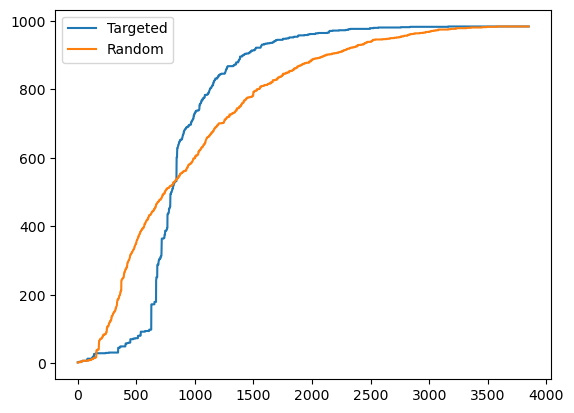

In [49]:
edges = sorted([(e.source(), e.target()) for e in u.edges()],
               key=lambda e: e[0].in_degree() * e[1].in_degree())

sizes, comp = gt.edge_percolation(u, edges)

np.random.shuffle(edges)

sizes2, comp = gt.edge_percolation(u, edges)

plt.plot(sizes, label="Targeted")

plt.plot(sizes2, label="Random")

plt.legend()

### k-core decomposition

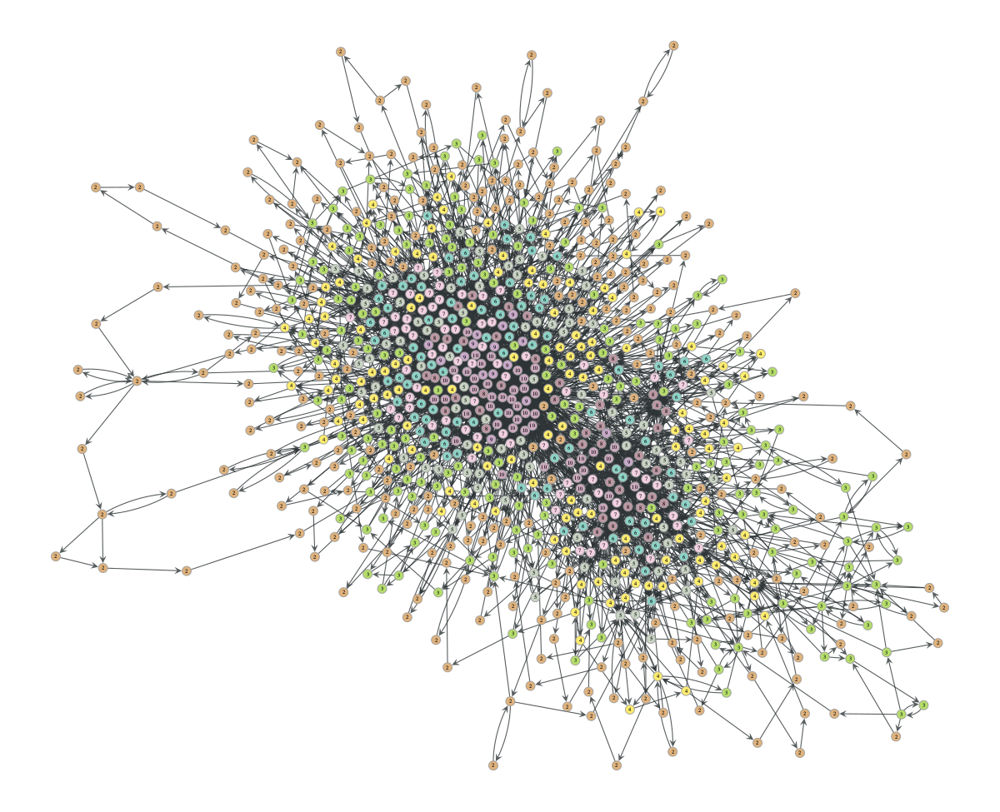

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1cdcdc190, at 0x1cf203c10>

In [50]:
kcore = gt.kcore_decomposition(u)
gt.graph_draw(u, vertex_fill_color=kcore, vertex_text=kcore)

In [51]:
gt.pseudo_diameter(u)

(16.0,
 (<Vertex object with index '560' at 0x1cf234c40>,
  <Vertex object with index '669' at 0x1cf235640>))

### centrality measures

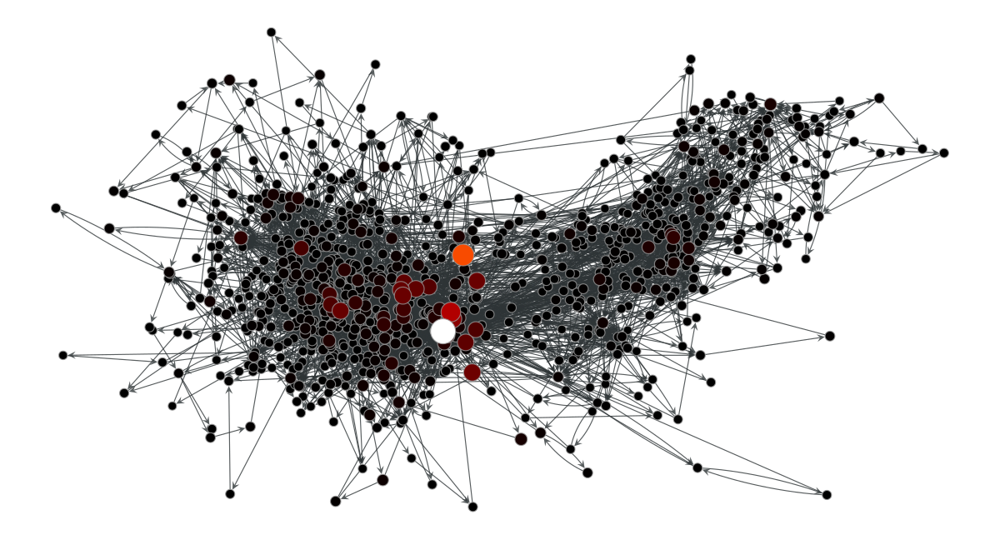

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1cdcdc190, at 0x1cf269e10>

In [52]:
pr = gt.pagerank(u)

gt.graph_draw(u, pos=u.vp["_pos"], vertex_fill_color=pr,

              vertex_size=gt.prop_to_size(pr, mi=5, ma=15),

              vorder=pr, vcmap=matplotlib.cm.gist_heat)

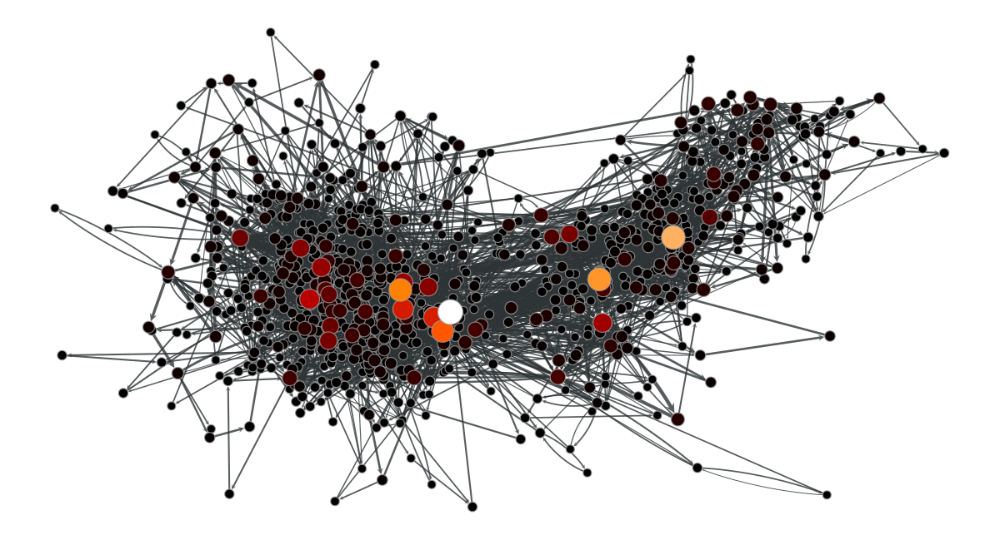

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1cdcdc190, at 0x1cf243dd0>

In [53]:
vp, ep = gt.betweenness(u)

gt.graph_draw(u, pos=u.vp["_pos"], vertex_fill_color=vp,

              vertex_size=gt.prop_to_size(vp, mi=5, ma=15),

              edge_pen_width=gt.prop_to_size(ep, mi=0.5, ma=5),

              vcmap=matplotlib.cm.gist_heat,

              vorder=vp)

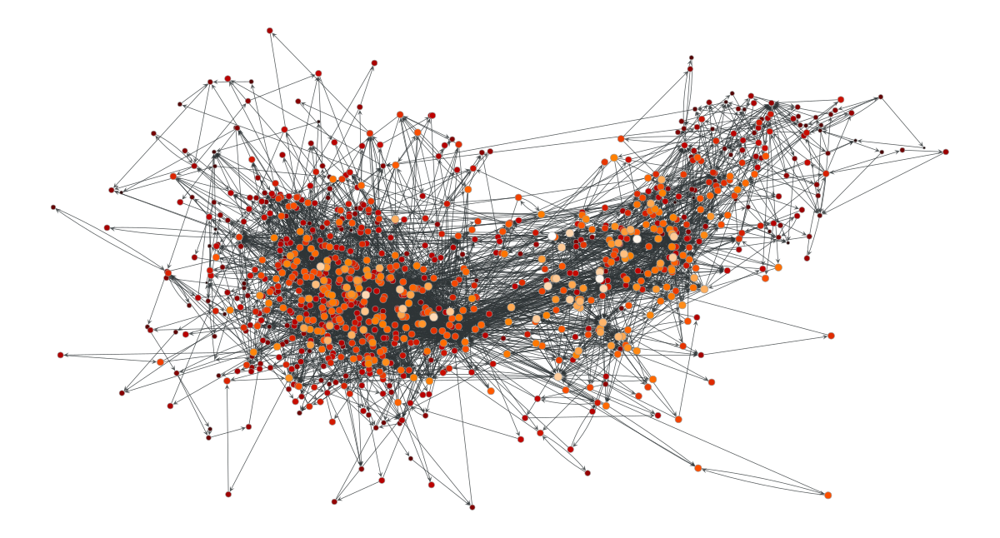

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1cdcdc190, at 0x1cf252290>

In [54]:
c = gt.closeness(u)

gt.graph_draw(u, pos=u.vp["_pos"], vertex_fill_color=c,

              vertex_size=gt.prop_to_size(c, mi=0.5, ma=5),

              vcmap=matplotlib.cm.gist_heat,

              vorder=c)

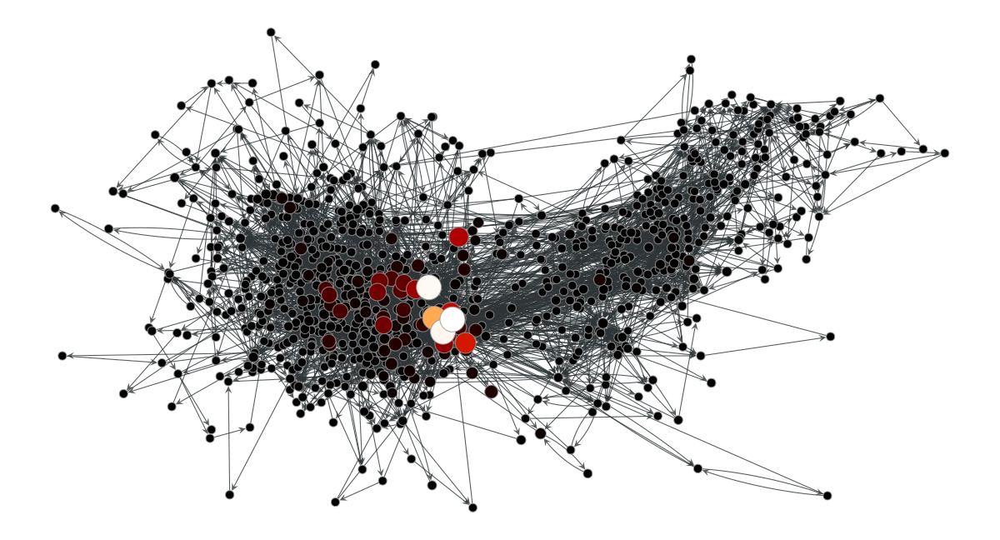

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1cdcdc190, at 0x1cf284950>

In [55]:
ee, x = gt.eigenvector(u, u.ep["weight"])

gt.graph_draw(u, pos=u.vp["_pos"], vertex_fill_color=x,

              vertex_size=gt.prop_to_size(x, mi=5, ma=15),

              vcmap=matplotlib.cm.gist_heat,

              vorder=x)

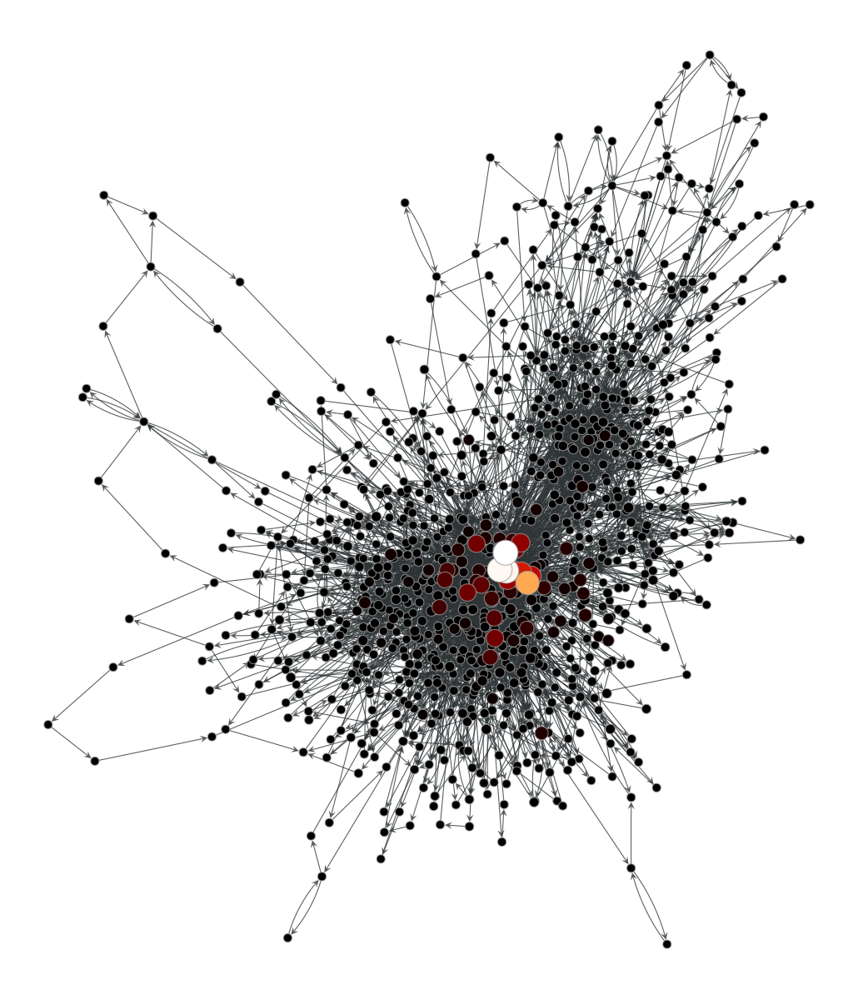

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1cdcdc190, at 0x1cf24fd50>

In [56]:
gt.graph_draw(u, pos=pos_fr, vertex_fill_color=x,

              vertex_size=gt.prop_to_size(x, mi=5, ma=15),

              vcmap=matplotlib.cm.gist_heat,

              vorder=x)

In [57]:
clust = gt.local_clustering(u)

print(gt.vertex_average(u, clust))

(0.18591759615341616, 0.008349199977371043)


In [58]:
print(clust.a)

[0.         0.02235536 0.0862069  0.33333333 0.03403756 0.02479784
 0.05128205 0.33333333 0.1969697  0.02777778 0.02150538 0.14285714
 0.0952381  0.         0.         0.33333333 0.14957983 0.04736842
 0.03287129 0.09428795 0.4        0.         0.10487805 0.
 0.16666667 0.1        0.06340326 0.08974359 0.03765227 0.
 0.06666667 0.08225108 0.         0.33333333 0.15789474 0.57142857
 0.33333333 0.73333333 0.13368984 0.25       0.2        0.08187135
 0.16995074 0.33333333 0.20833333 0.         0.16666667 0.04444444
 0.         0.10641026 0.         0.5        0.09803922 0.15555556
 0.10714286 0.05928854 0.39047619 0.04347826 0.         0.25833333
 0.07130125 0.02777778 0.16908563 0.07575758 0.08547009 0.0952381
 0.         0.21818182 1.         0.16666667 0.26406926 0.01666667
 0.         0.37944664 0.11033682 0.1        0.         0.02727273
 0.16666667 0.22727273 0.13333333 0.         0.         0.32679739
 0.04444444 0.         0.         0.66666667 0.33333333 0.07246377
 0.16666667 

In [61]:
out_degs = u.get_out_degrees(u.get_vertices())

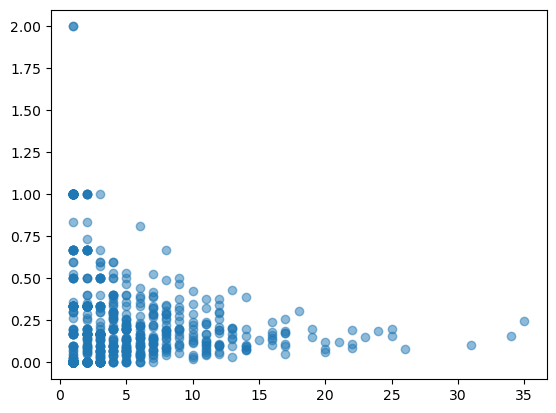

In [62]:
plt.scatter(out_degs, clust.a, alpha=0.5)

In [63]:
in_degs = u.get_in_degrees(u.get_vertices())

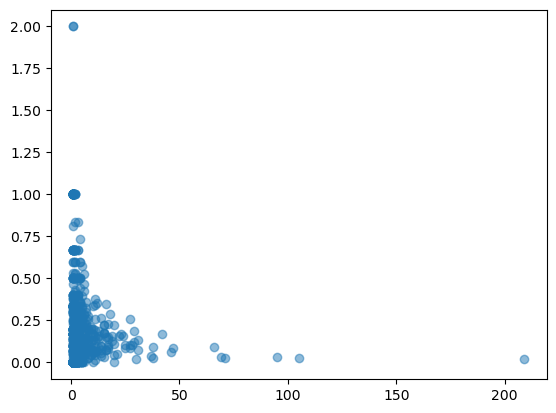

In [64]:
plt.scatter(in_degs, clust.a, alpha=0.5)

### Blockmodel

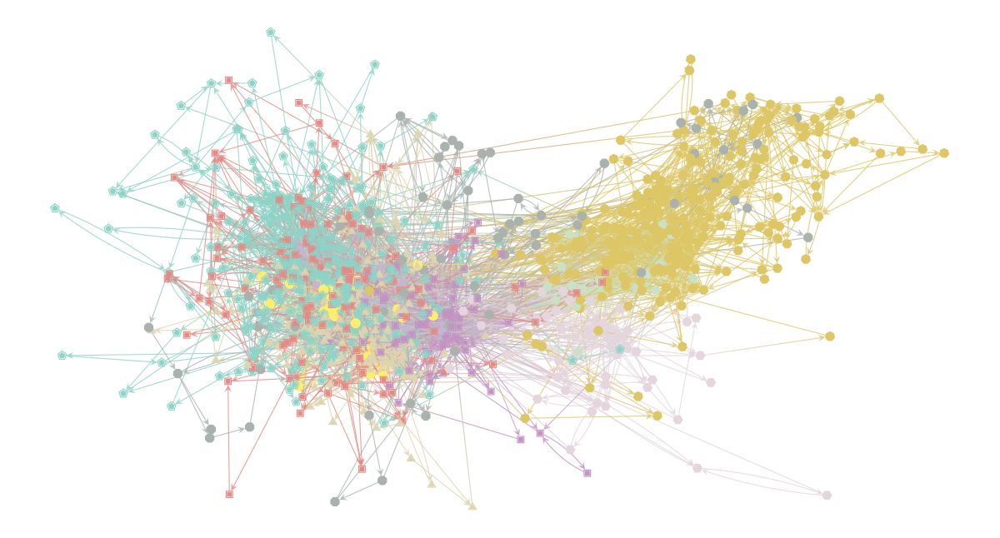

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1cdcdc190, at 0x1cdce7a10>

In [65]:
state = gt.minimize_blockmodel_dl(u)

state.draw(pos=u.vp["_pos"], vertex_shape=state.get_blocks())

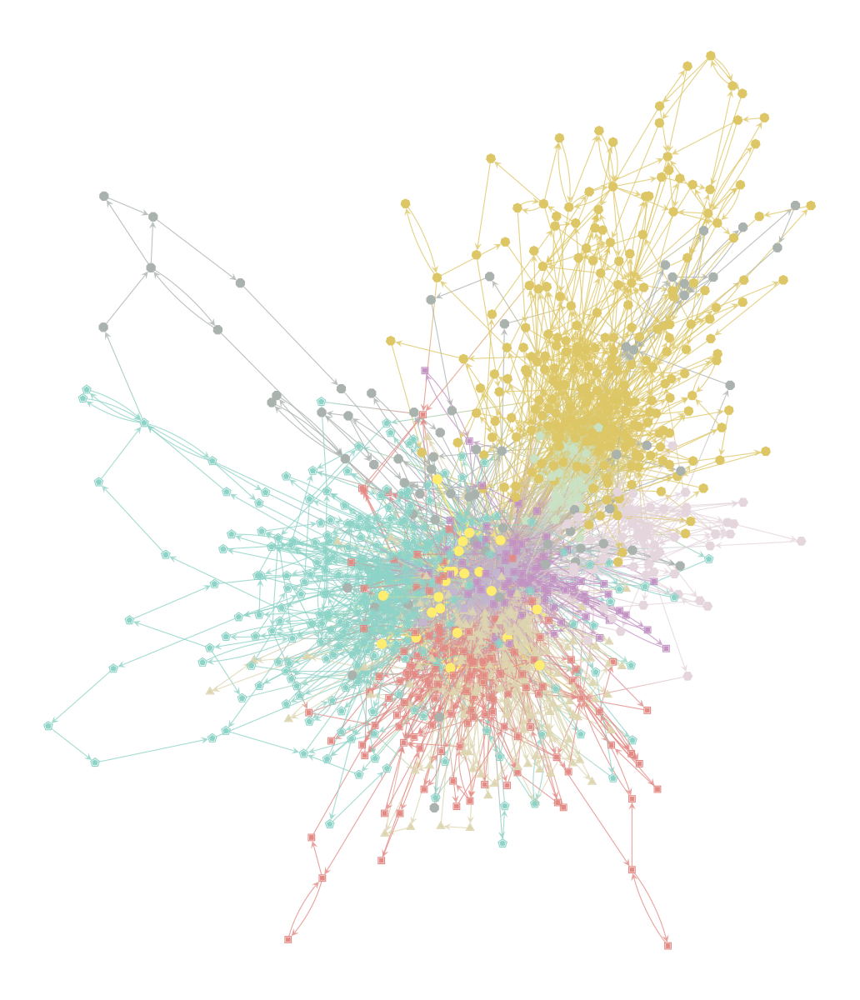

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1cdcdc190, at 0x1cf2fbcd0>

In [66]:
state.draw(pos=pos_fr, vertex_shape=state.get_blocks())

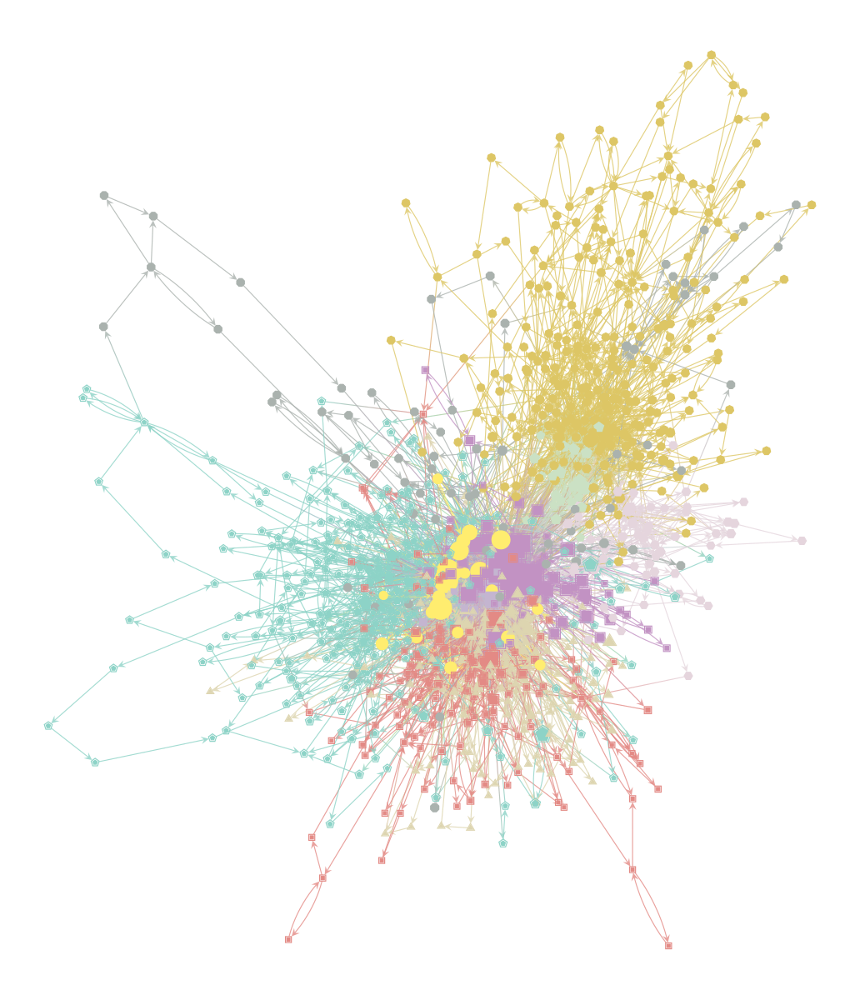

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1cdcdc190, at 0x1cf2e52d0>

In [67]:
state.draw(pos=pos_fr, vertex_shape=state.get_blocks(), vertex_size=gt.prop_to_size(x, mi=5, ma=25))


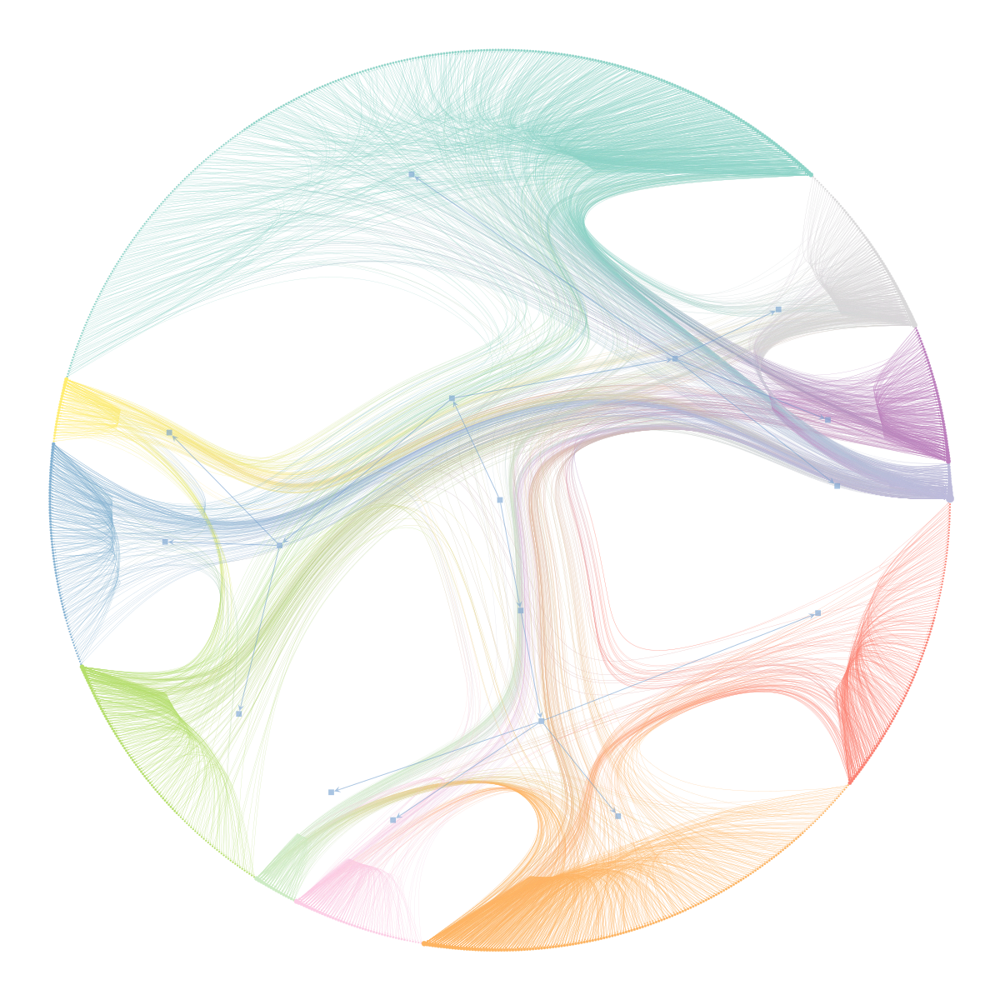

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1cdcdc190, at 0x1cee34190>,
 <GraphView object, directed, with 1001 vertices and 1000 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x1cee6db50, at 0x1cec48b10>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x1cee6db50, at 0x1cec48090>, False), at 0x1cee6db50>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x1cee6db50, at 0x1cee9a110>)

In [68]:
state2 = gt.minimize_nested_blockmodel_dl(u)

state2.draw()

In [69]:
print(state.get_blocks().a)

[954   2   2 713   2   2 278 278 933   2 954 933 933 933 954 248 804 713
   2 601 933 954 248 954 248 954 933 954 248 954 933 933 713 713 601 804
 804 601 601 954 933 933 787 954 248 278 804 278 954 688 601 278 933 954
 933 933 601 933 954 688 933 954 601 954   2 933 933 248 954 248 601 954
 713 601 787 954 713 954 954 248 933 933 248 601 713 933 933 713 601   2
 713 248 954 248 933 933 688 688 688 933 954 954 248 713 954 954 954 248
 933 248 954 278 954 601 248 933 688 933 713 278 933 688 933 787 787 278
 954 933 933 954 954 933 248 248 248 933 601 248 954 954 933 278 248 248
 954 248 933 278 787 713 954 713 933 933 248 601 954 248 933 933 713 713
 713 954 933 933 933 601 933 933 933 954 787 248 933 713 248 954 248 248
 804 804 954 248 954 713 954 787 933 601 933 787 933 713 933 248 954 248
 713 248 933 278 933 248 954 248 933 954 954 933 601 248 248 954 954 933
 804 954 804 954 933 248 954 601 954 713 601 688 601 248 804 248 933 601
 713 804 954 954 248 248 713 933 954 713 713   2 93

In [70]:
print(u.vp["name"].a)

[  3571     88   4509  28664   5226   1988  33642  60810  16344    349
    519  82945  20919  34963    205    468  33833   2014    677   3998
  14628    503   1276  25934   2417  17155   6940   2342    511   2175
  65008  34236   2662   4730  64911  50244  80429  39420  13813 106226
  40253  14075  14615   5335   3994   3629   7566  52908 208518  12751
 128773 263871  37532  17145  77555  14565  78701  14625   2280  39889
  19913 118818  11991  19870  35843   4893  31698   5280  10923  27147
  42182   3808  13383  92274  35376  16011   2166   9964  53449  14907
  14611  37487  26661  98204  47794  57739  54039   4720  26153  45605
  11597  73505  21585    439  16547  14064  13808  26158 110170  14577
   8135  39464   3972  41854  15210   1134    553  14945 102436  27483
  20385  26186  98645  19604   6585  27738  13798  22634   7690  90083
  61753   6241  65682  49179  30225 156668  11036  86909  31086  13122
   1270  16523  11542  23159  49825  59893  19650   4665  49123   5716
  3536

In [71]:
u.save("retweets.graphml")

In [72]:
g_wiki = gt.collection.ns["wikipedia_link/de"]

In [74]:
print(g_wiki)

<Graph object, directed, with 3603726 vertices and 96865851 edges, 7 internal graph properties, at 0x1cf355b90>


In [76]:
g_wiki.list_properties()

name              (graph)   (type: string, val: wikipedia_link (de))
description       (graph)   (type: string, val: Networks of hyperlinks among
                                                articles on Wikipedia, for all
                                                available languages. A directed
                                                edge (i,j) indicates that
                                                article i hyperlinks to j.)
citation          (graph)   (type: string, val: ['J. Kunegis, "Wikipedia
                                                links." KONECT - The Koblenz
                                                Network Collection (2016).,
                                                http://konect.cc/'])
url               (graph)   (type: string, val: http://konect.cc/networks/wikip
                                                edia_link_en)
tags              (graph)   (type: vector<string>, val: ['Informational', 'Web
                             

In [78]:
g_gov = gt.collection.ns["us_agencies/alabama"]

In [79]:
g_gov.list_properties()

name                (graph)   (type: string, val: us_agencies (alabama))
description         (graph)   (type: string, val: 50 networks, one for each
                                                  U.S. state, representing the
                                                  web-based links between their
                                                  associated government
                                                  agencies websites. A node is
                                                  an entire agency website and
                                                  a directed edge (i,j)
                                                  represents the existence of a
                                                  hyperlink from any webpage in
                                                  website i to some webpage in
                                                  website j. Data was collected
                                                  with a crawler. Nodes

In [81]:
g_email = gt.collection.ns["email_enron"]

In [83]:
g_email.list_properties()

name            (graph)   (type: string, val: email_enron)
description     (graph)   (type: string, val: The Enron email corpus,
                                              containing all the email
                                              communication from the Enron
                                              corporation, which was made
                                              public as a result of legal
                                              action. Nodes are email addresses
                                              and node i links to node j if i
                                              sent at least one email to
                                              address j. Non-Enron email
                                              addresses are also present, but
                                              only their links to/from Enron
                                              addresses are observed.)
citation        (graph)   (type: string, val: [

In [87]:
g_faculty = gt.collection.ns["faculty_hiring_us/academia"]

In [88]:
g_faculty.list_properties()

name              (graph)   (type: string, val: faculty_hiring_us (academia))
description       (graph)   (type: string, val: Networks of faculty hiring for
                                                all PhD-granting US
                                                universities over the decade
                                                2011–2020. Each node is a PhD-
                                                granting institution, and a
                                                directed edge (i,j) indicates
                                                that a person received their
                                                PhD from node i and was tenure-
                                                track faculty at node j during
                                                time of collection (2011-2020).
                                                This dataset is divided into
                                                separate networks for al

In [90]:
g_cop = gt.collection.ns["copenhagen/sms"]

In [91]:
g_cop.list_properties()

name            (graph)   (type: string, val: copenhagen (sms))
description     (graph)   (type: string, val: A network of social interactions
                                              among university students within
                                              the Copenhagen Networks Study,
                                              over a period of four weeks,
                                              sampled every 5 minutes.
                                              Interactions include physical
                                              proximity (undirected), phone
                                              calls (directed, weighted), text
                                              messages (directed), and
                                              information about Facebook
                                              friendships (undirected). Nodes
                                              include some metadata, including
                       